In [43]:
import pandas as pd
import numpy as np
import seaborn as sb
import copy
import pandas_profiling
import matplotlib.pyplot as plt
from imblearn.over_sampling import SMOTE
from sklearn.preprocessing import OneHotEncoder as ohe, LabelEncoder as le
import warnings
from tqdm import tqdm
import pickle
from sklearn.tree import DecisionTreeClassifier
from sklearn.linear_model import LinearRegression
from xgboost import XGBRegressor
from lightgbm import LGBMRegressor
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score, mean_absolute_error
from sklearn.model_selection import train_test_split as tts, RepeatedKFold
from sklearn.metrics import classification_report as cr
from sklearn.model_selection import RandomizedSearchCV, GridSearchCV
from mlxtend.feature_selection import SequentialFeatureSelector as sfs
#from hyperopt import hp,fmin,tpe,STATUS_OK,Trials
import optuna
from sklearn.pipeline import Pipeline
from sklearn.preprocessing import StandardScaler
from tpot import TPOTRegressor
from sklearn.ensemble import AdaBoostRegressor
import tensorflow as tf
import tensorflow_addons as tfa
from tensorflow.keras import Sequential
from tensorflow.keras.layers import Dense, Dropout
%matplotlib inline
warnings.filterwarnings('ignore')
pd.set_option('display.max_columns', None)

In [44]:
df = pd.read_csv('forModel.csv')

In [45]:
df.tail()

,incident_number,offense_code,offense_code_group,offense_description,district,reporting_area,shooting,occurred_on_date,year,month,day_of_week,hour,ucr_part,street,lat,long,location,season,avg_high_temp (C),avg_low_temp (C),avg_precipitation (inches),snow (inches),unemployement_rate,Day,Night
581164,210700265,3125,warrant arrest - boston warrant (must be supplemental),warrant arrest - boston warrant (must be supplemental),B3,476,0,2022-04-05,2022,4,Tuesday,6,Part Three,cummins hwy,42.268642,-71.095655,"(42.268642296887826, -71.09565499637984)",spring,15.444444,-9.197531,5.73,1.2,0.0,1,0
581165,149210376,3110,service to other agency,service to other agency,B2,,0,2022-01-02,2022,1,Sunday,0,Part Three,washington st & roxbury st\nboston ma 02119\nunited,42.329600,-71.084620,"(42.32959998129787, -71.08462000476281)",winter,5.000000,-15.000000,4.25,8.9,0.0,0,1
581166,122056850,3801,m/v accident - other,m/v accident - other,D4,271,0,2022-07-28,2022,7,Thursday,19,Part Three,massachusetts ave & harrison ave\nboston ma 02118\n,42.334910,-71.075170,"(42.334909956083834, -71.07517004893332)",summer,26.666667,-2.962963,4.03,0.0,0.0,0,1
581167,122004001,3115,investigate person,investigate person,E13,912,0,2022-01-19,2022,1,Wednesday,9,Part Three,heath st,42.325131,-71.099408,"(42.32513050637361, -71.09940814578592)",winter,5.000000,-15.000000,4.25,8.9,0.0,1,0
581168,22031068,3114,investigate property,investigate property,C11,249,0,2022-05-02,2022,5,Monday,8,Part Three,saxton st,42.313591,-71.054324,"(42.31359091105722, -71.05432387045848)",spring,16.944444,-8.364198,3.45,0.0,0.0,1,0


In [46]:
df.shape

(581169, 25)

In [47]:
df.season.unique()

array(['summer', 'fall', 'winter', 'spring'], dtype=object)

In [48]:
partOne = list(set(df.groupby('ucr_part').get_group('Part One')['offense_code']))
partTwo = list(set(df.groupby('ucr_part').get_group('Part Two')['offense_code']))
partThree = list(set(df.groupby('ucr_part').get_group('Part Three')['offense_code']))
partOther = list(set(df.groupby('ucr_part').get_group('Other')['offense_code']))

In [49]:
for i in tqdm(df.index):
    if df['offense_code'][i] in partOne:
        df['offense_code'][i] = 'serious_crime'
    elif df['offense_code'][i] in partTwo:
        df['offense_code'][i] = 'intermediate_crime'
    elif df['offense_code'][i] in partThree:
        df['offense_code'][i] = 'low_level_crime'
    elif df['offense_code'][i] in partOther:
        df['offense_code'][i] = 'other_crime'

100%|███████████████████████████████████████████████████████████████████████| 581169/581169 [00:09<00:00, 61096.43it/s]


In [50]:
df['unemployement_rate'].nunique()

16

##  We will trying predict how much case will occur a day.

## We will create with dataframe included district, occured on date, incident number (counted by days& district),day of week for modelling.

## If we add the Ucr_part and Hour features, they do not increase the score of our model. We do not include these to reduce complexity.


In [51]:
df_reg = pd.DataFrame(df.groupby(["occurred_on_date","district", "day_of_week"])["incident_number"].count()).reset_index()
df_reg.tail(30)



,occurred_on_date,district,day_of_week,incident_number
31805,2022-08-28,A15,Sunday,1
31806,2022-08-28,A7,Sunday,2
31807,2022-08-28,B2,Sunday,16
31808,2022-08-28,B3,Sunday,15
31809,2022-08-28,C11,Sunday,17
...,...,...,...,...
31830,2022-08-30,C11,Tuesday,2
31831,2022-08-30,C6,Tuesday,1
31832,2022-08-30,D14,Tuesday,1
31833,2022-08-30,D4,Tuesday,2


In [52]:
df_reg.day_of_week.nunique()

7

In [53]:
df_reg.isnull().sum()

occurred_on_date    0
district            0
day_of_week         0
incident_number     0
dtype: int64

In [54]:
df_reg.tail(30)

,occurred_on_date,district,day_of_week,incident_number
31805,2022-08-28,A15,Sunday,1
31806,2022-08-28,A7,Sunday,2
31807,2022-08-28,B2,Sunday,16
31808,2022-08-28,B3,Sunday,15
31809,2022-08-28,C11,Sunday,17
...,...,...,...,...
31830,2022-08-30,C11,Tuesday,2
31831,2022-08-30,C6,Tuesday,1
31832,2022-08-30,D14,Tuesday,1
31833,2022-08-30,D4,Tuesday,2


In [55]:
df_reg.rename(columns = {'incident_number' : 'case_count'}, inplace = True)

In [56]:
df_reg['day_of_week'] = df_reg['day_of_week'].map({'Monday' : 1,
                                                  'Tuesday' : 2,
                                                  'Wednesday':3,
                                                  'Thursday' : 4,
                                                  "Friday" : 5,
                                                  'Saturday' : 6,
                                                  'Sunday' : 7})

In [57]:
df_reg = pd.concat([df_reg, pd.get_dummies(df_reg['district'], prefix = 'D')]
                   , axis = 1)

In [58]:
df_reg = pd.concat([df_reg, pd.get_dummies(df_reg['day_of_week'], prefix = 'day')]
                   , axis = 1)

In [59]:
df_reg.drop('district', axis = 1, inplace = True)

In [60]:
df_reg.drop('day_of_week', axis = 1, inplace = True)

In [61]:
df_reg.tail(30)

,occurred_on_date,case_count,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5,D_External,day_1,day_2,day_3,day_4,day_5,day_6,day_7
31805,2022-08-28,1,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
31806,2022-08-28,2,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
31807,2022-08-28,16,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
31808,2022-08-28,15,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
31809,2022-08-28,17,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31830,2022-08-30,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
31831,2022-08-30,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
31832,2022-08-30,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
31833,2022-08-30,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0


In [62]:
df_reg["D_A1"] = np.int64(df_reg["D_A1"])
df_reg["D_A15"] = np.int64(df_reg["D_A15"])
df_reg["D_A7"] = np.int64(df_reg["D_A7"])
df_reg["D_B2"] = np.int64(df_reg["D_B2"])
df_reg["D_B3"] = np.int64(df_reg["D_B3"])
df_reg["D_C11"] = np.int64(df_reg["D_C11"])
df_reg["D_C6"] = np.int64(df_reg["D_C6"])
df_reg["D_D14"] = np.int64(df_reg["D_D14"])
df_reg["D_D4"] = np.int64(df_reg["D_D4"])
df_reg["D_E13"] = np.int64(df_reg["D_E13"])
df_reg["D_E18"] = np.int64(df_reg["D_E18"])
df_reg["D_E5"] = np.int64(df_reg["D_E5"])
df_reg["D_External"] = np.int64(df_reg["D_External"])


In [63]:
df_reg["day_1"] = np.int64(df_reg["day_1"])
df_reg["day_2"] = np.int64(df_reg["day_2"])
df_reg["day_3"] = np.int64(df_reg["day_3"])
df_reg["day_4"] = np.int64(df_reg["day_4"])
df_reg["day_5"] = np.int64(df_reg["day_5"])
df_reg["day_6"] = np.int64(df_reg["day_6"])
df_reg["day_7"] = np.int64(df_reg["day_7"])

In [64]:
df_reg['occurred_on_date'] = pd.to_datetime(df_reg['occurred_on_date'])

In [65]:
df_reg.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 31835 entries, 0 to 31834
Data columns (total 22 columns):
 #   Column            Non-Null Count  Dtype         
---  ------            --------------  -----         
 0   occurred_on_date  31835 non-null  datetime64[ns]
 1   case_count        31835 non-null  int64         
 2   D_A1              31835 non-null  int64         
 3   D_A15             31835 non-null  int64         
 4   D_A7              31835 non-null  int64         
 5   D_B2              31835 non-null  int64         
 6   D_B3              31835 non-null  int64         
 7   D_C11             31835 non-null  int64         
 8   D_C6              31835 non-null  int64         
 9   D_D14             31835 non-null  int64         
 10  D_D4              31835 non-null  int64         
 11  D_E13             31835 non-null  int64         
 12  D_E18             31835 non-null  int64         
 13  D_E5              31835 non-null  int64         
 14  D_External        3183

In [66]:
# since linear regression model does not take datetime data type as input so we will convert it to gregorian number.
df_reg['occurred_on_date'] = df_reg['occurred_on_date'].apply(lambda x: x.toordinal())

In [67]:
df_reg

,occurred_on_date,case_count,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5,D_External,day_1,day_2,day_3,day_4,day_5,day_6,day_7
0,735764,23,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,735764,5,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,735764,10,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,735764,34,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,735764,26,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31830,738397,2,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
31831,738397,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
31832,738397,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
31833,738397,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0


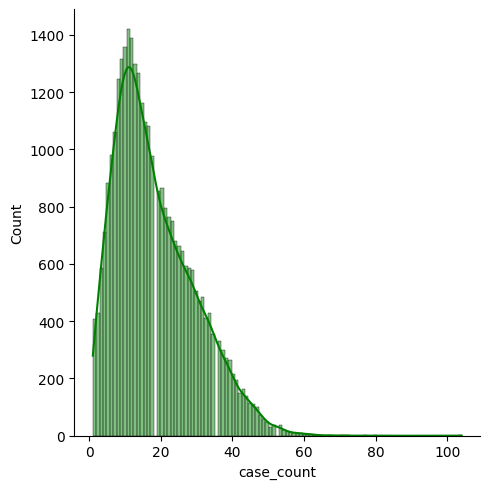

In [68]:
sb.displot(data = df_reg, x = 'case_count', kde = True, color = 'green')

In [69]:
df_reg.std()

occurred_on_date    759.625416
case_count           11.157229
D_A1                  0.275444
D_A15                 0.272953
D_A7                  0.275397
D_B2                  0.275492
D_B3                  0.275492
D_C11                 0.275492
D_C6                  0.275492
D_D14                 0.275492
D_D4                  0.275492
D_E13                 0.275444
D_E18                 0.275492
D_E5                  0.275444
D_External            0.094194
day_1                 0.350385
day_2                 0.349969
day_3                 0.349937
day_4                 0.349905
day_5                 0.350097
day_6                 0.349648
day_7                 0.349584
dtype: float64

In [70]:
df_reg.to_csv('final_dataframe.csv', index = False)

In [71]:
x = df_reg.drop('case_count', axis = 1)
y = df_reg['case_count']

In [72]:
scaled = StandardScaler()
#x = scaled.fit_transform(x)

In [73]:
x

,occurred_on_date,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5,D_External,day_1,day_2,day_3,day_4,day_5,day_6,day_7
0,735764,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,735764,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,735764,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,735764,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,735764,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31830,738397,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
31831,738397,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
31832,738397,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
31833,738397,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0


In [74]:
x_train, x_test, y_train, y_test = tts(x, y, test_size = 0.2, random_state = 142)

In [75]:
x_train

,occurred_on_date,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5,D_External,day_1,day_2,day_3,day_4,day_5,day_6,day_7
29763,738226,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1308,735873,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
26132,737925,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
24528,737795,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
22023,737593,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7436,736384,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
12799,736831,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
31131,738339,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
7365,736378,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0


In [76]:
x

,occurred_on_date,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5,D_External,day_1,day_2,day_3,day_4,day_5,day_6,day_7
0,735764,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
1,735764,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
2,735764,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
3,735764,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
4,735764,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
31830,738397,0,0,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0
31831,738397,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0
31832,738397,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0
31833,738397,0,0,0,0,0,0,0,0,1,0,0,0,0,0,1,0,0,0,0,0


In [77]:
#x_train = x_train.values

# Models

## LinearRegression 

In [78]:
lr = LinearRegression().fit(x_train, y_train)
pred = lr.predict(x_test)
print(r2_score(y_test, pred))

0.7133625369104919


In [79]:
print(r2_score( lr.predict(x_train), y_train))

0.5897830718130408


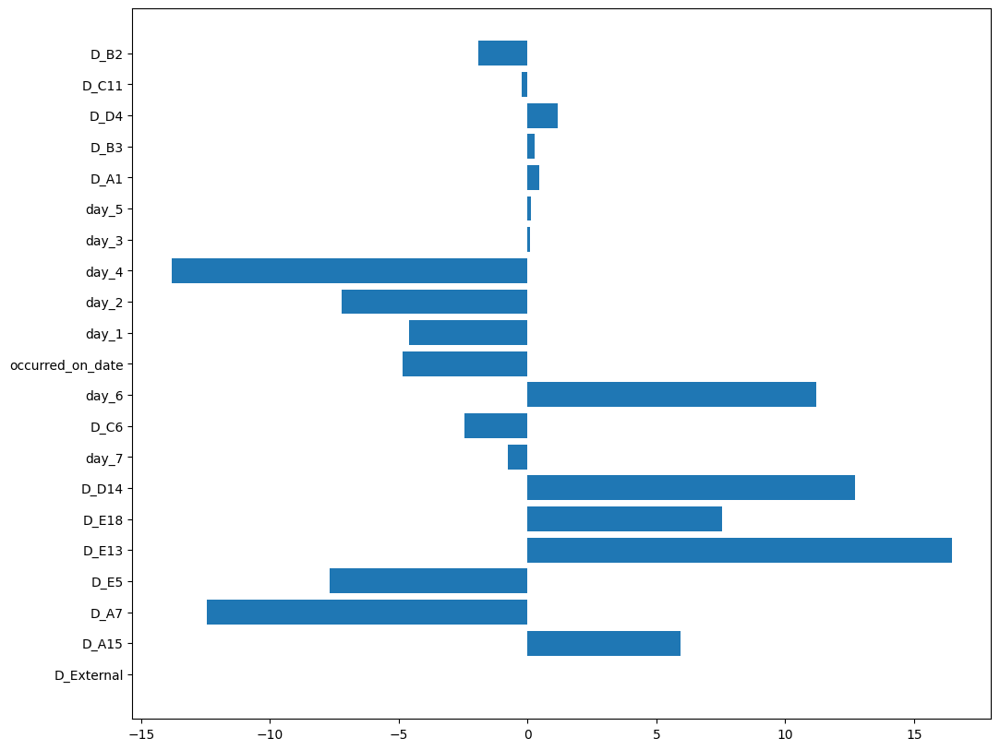

In [80]:
plt.figure(figsize=(12, 10))
feature_names = list(x.columns)
importances = lr.coef_
indices = np.argsort(importances)
plt.barh([x for x in range(len(importances))], importances)
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.show()

## XGBRegressor 

In [81]:
xgb = XGBRegressor(n_estimators = 200).fit(x_train, y_train)
pred = xgb.predict(x_test)
print(r2_score(y_test, pred))

0.7806570438140592


<Figure size 800x100 with 0 Axes>

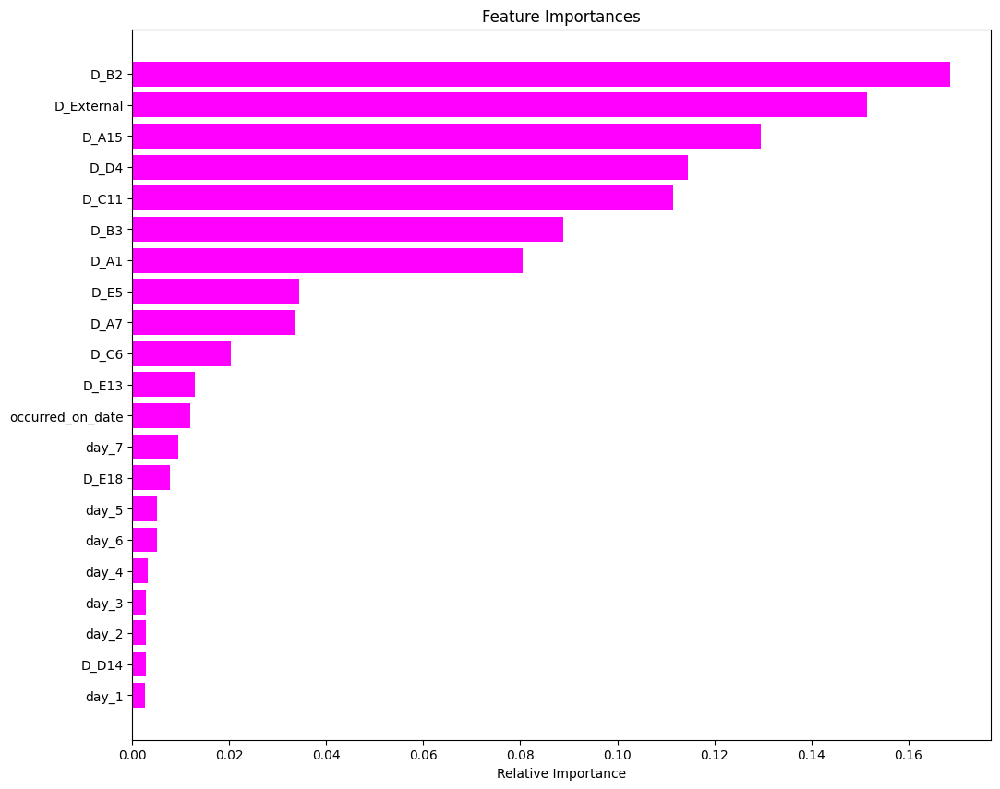

In [88]:
plt.figure(figsize=(8, 1))
feature_names = list(x.columns)
importances = xgb.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12, 10))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="magenta", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [89]:
from sklearn.metrics import tpr

ImportError: cannot import name 'tpr' from 'sklearn.metrics' (c:\users\shadow\appdata\local\programs\python\python39\lib\site-packages\sklearn\metrics\__init__.py)

## LGBMRegressor

In [186]:
lgbm = LGBMRegressor(n_estimators = 200).fit(x_train, y_train)
pred = lgbm.predict(x_test)
print(r2_score(y_test, pred))

0.7844895561773819


In [187]:
print(r2_score( lgbm.predict(x_train), y_train))

0.7496399580741153


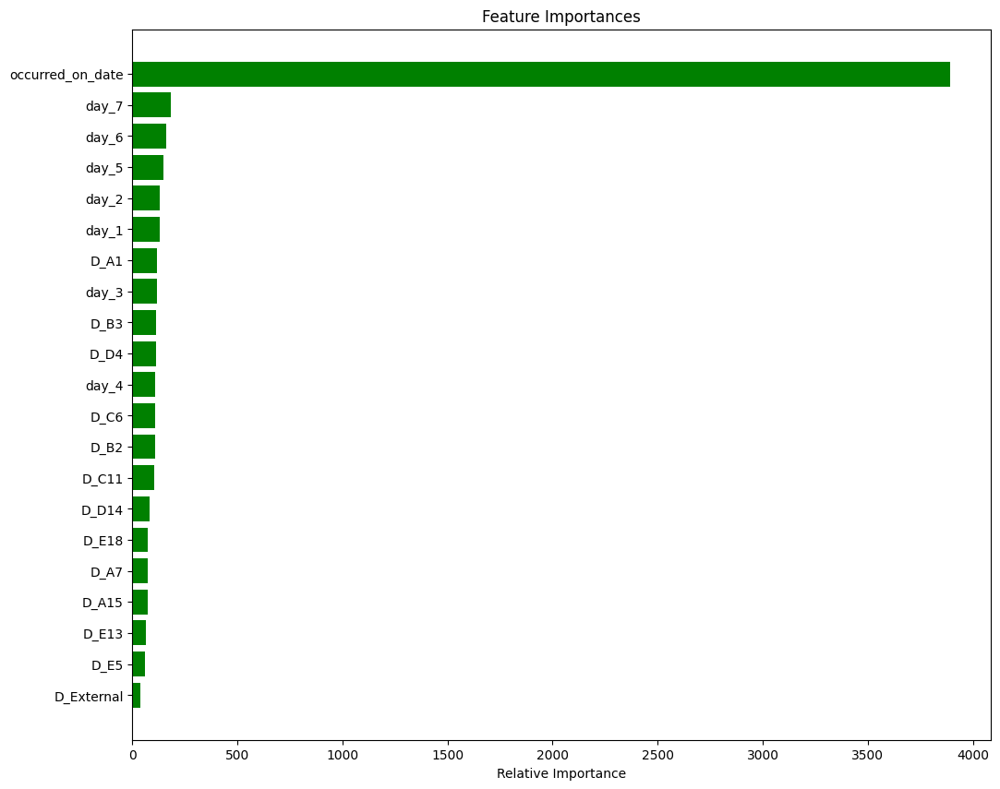

In [84]:
feature_names = list(x.columns)
importances = lgbm.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12, 10))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="green", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

## RandomForestRegressor

In [188]:
rfr = RandomForestRegressor(n_estimators = 200).fit(x_train, y_train)
pred = rfr.predict(x_test)
print(r2_score(y_test, pred))

0.7299037368192867


In [189]:
print(r2_score( rfr.predict(x_train), y_train))

0.9585292367441862


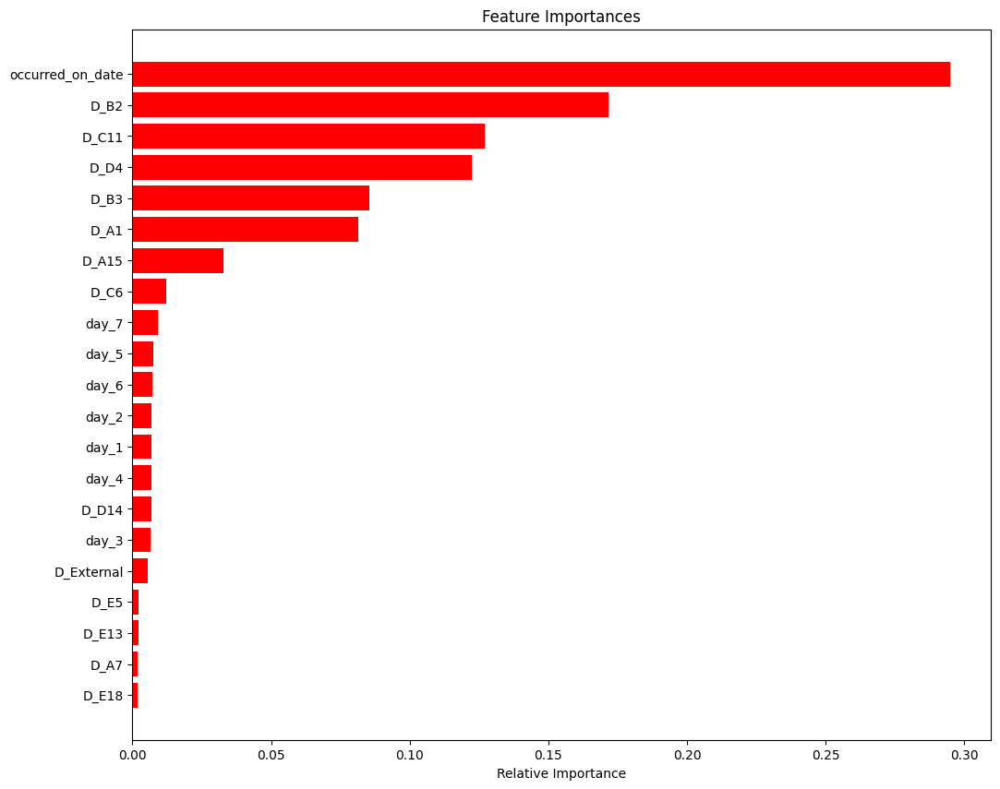

In [87]:
feature_names = list(x.columns)
importances = rfr.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12, 10))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="red", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [146]:
algo_accuracy

,Algorithms,Test_r2_score,Train_r2_score
0,LGBMRegressor,0.798,0.750
1,LGBM(RandomizedSearchCV),0.777,0.755
2,RandomForestRegressor(GridSearch),0.773,0.751
3,XGBRegressor,0.760,0.840
4,LGBM(SequentialFeatureSelector),0.753,0.716
5,TPOTRegressor,0.732,0.709
6,RandomForestRegressor,0.720,0.950
7,LinearRegression,0.700,0.590
8,AutoKeras,0.660,0.667


# Hyperparameter Tuning
## RandomizedSearchCV (LGBM)

In [195]:
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
lgbm = LGBMRegressor(n_jobs = -1, device_type = "gpu")

param_test ={'num_leaves': sp_randint(6, 50), 
             'min_child_samples': sp_randint(100, 500), 
             'min_child_weight': [1e-5, 1e-3, 1e-2, 1e-1, 1, 1e1, 1e2, 1e3, 1e4],
             'subsample': sp_uniform(loc=0.2, scale=0.8), 
             'colsample_bytree': sp_uniform(loc=0.4, scale=0.6),
             'reg_alpha': [0, 1e-1, 1, 2, 5, 7, 10, 50, 100],
             'reg_lambda': [0, 1e-1, 1, 5, 10, 20, 50, 100]}
rscv = RandomizedSearchCV(lgbm, param_test, n_iter = 100, cv = 5, verbose = 2).fit(x_train, y_train)

Fitting 5 folds for each of 100 candidates, totalling 500 fits
[CV] END colsample_bytree=0.8329361053732762, min_child_samples=353, min_child_weight=1e-05, num_leaves=8, reg_alpha=7, reg_lambda=0, subsample=0.38634644258165596; total time=   8.7s
[CV] END colsample_bytree=0.8329361053732762, min_child_samples=353, min_child_weight=1e-05, num_leaves=8, reg_alpha=7, reg_lambda=0, subsample=0.38634644258165596; total time=   0.4s
[CV] END colsample_bytree=0.8329361053732762, min_child_samples=353, min_child_weight=1e-05, num_leaves=8, reg_alpha=7, reg_lambda=0, subsample=0.38634644258165596; total time=   0.2s
[CV] END colsample_bytree=0.8329361053732762, min_child_samples=353, min_child_weight=1e-05, num_leaves=8, reg_alpha=7, reg_lambda=0, subsample=0.38634644258165596; total time=   0.2s
[CV] END colsample_bytree=0.8329361053732762, min_child_samples=353, min_child_weight=1e-05, num_leaves=8, reg_alpha=7, reg_lambda=0, subsample=0.38634644258165596; total time=   0.2s
[CV] END colsampl

In [196]:
rscv.best_params_

{'colsample_bytree': 0.5670092628924497,
 'min_child_samples': 164,
 'min_child_weight': 1,
 'num_leaves': 48,
 'reg_alpha': 2,
 'reg_lambda': 0.1,
 'subsample': 0.7400358767097952}

In [197]:
lgbm = LGBMRegressor(num_leaves= 48,
 min_child_samples = 164,
 min_child_weight= 1,
 subsample = 0.7400358767097952,
 colsample_bytree = 0.5670092628924497,
 reg_alpha = 2,
 reg_lambda = 0.1).fit(x_train, y_train)
pred = lgbm.predict(x_test)
print(r2_score(y_test, pred))
print(r2_score(lgbm.predict(x_train),y_train))

0.7860410628493775
0.7274804918256886


In [49]:
xgb.predict(scaled.transform([[738660,0 ,0 	,0, 0 	,1 	,0 ,	0 ,	0 ,	0 	,0 	,0 ,	0 	,0 ,	0 ,	0 	,1 	,0	,0,	0 ,	0]]))

array([15.199241], dtype=float32)

In [47]:
li = [735764,1 ,0 	,0, 0 	,0 	,0 ,	0 ,	0 ,	0 	,0 	,0 ,	0 	,1 ,	0 ,	0 	,0 	,0 	,0 ,	0 ,	0]

## RandomizedSearchCV (RandomForestRegressor)

In [111]:
rfr = RandomForestRegressor(n_jobs = -1)
# Number of trees in random forest
n_estimators = [int(x) for x in np.linspace(start = 150, stop = 1500, num = 10)]
# Number of features to consider at every split
max_features = ['auto', 'sqrt','log2']
# Maximum number of levels in tree
max_depth = [int(x) for x in np.linspace(10, 1000,10)]
# Minimum number of samples required to split a node
min_samples_split = [2, 5, 10,14, 20, 22]
# Minimum number of samples required at each leaf node
min_samples_leaf = [1, 2, 4,6,8, 16, 32]
# Create the random grid
random_grid = {'n_estimators': n_estimators,
               'max_features': max_features,
               'max_depth': max_depth,
               'min_samples_split': min_samples_split,
               'min_samples_leaf': min_samples_leaf}
rscv = RandomizedSearchCV(rfr, random_grid, n_iter = 100, cv = 3, verbose = 20).fit(x_train, y_train)

Fitting 3 folds for each of 100 candidates, totalling 300 fits
[CV 1/3; 1/100] START max_depth=120, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=1200
[CV 1/3; 1/100] END max_depth=120, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=1200;, score=0.756 total time=   6.1s
[CV 2/3; 1/100] START max_depth=120, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=1200
[CV 2/3; 1/100] END max_depth=120, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=1200;, score=0.746 total time=   3.8s
[CV 3/3; 1/100] START max_depth=120, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=1200
[CV 3/3; 1/100] END max_depth=120, max_features=log2, min_samples_leaf=2, min_samples_split=10, n_estimators=1200;, score=0.750 total time=   3.6s
[CV 1/3; 2/100] START max_depth=10, max_features=sqrt, min_samples_leaf=1, min_samples_split=5, n_estimators=1500
[CV 1/3; 2/100] END max_depth=10, 

In [112]:
rscv.best_params_

{'n_estimators': 900,
 'min_samples_split': 10,
 'min_samples_leaf': 16,
 'max_features': 'auto',
 'max_depth': 450}

In [113]:
rfr = RandomForestRegressor(n_estimators = 900,
 min_samples_split = 10,
 min_samples_leaf= 16,
 max_features = 'auto',
 max_depth = 450).fit(x_train, y_train)
pred = rfr.predict(x_test)
print(r2_score(y_test, pred))
print(r2_score(rfr.predict(x_train), y_train))

0.773897708784135
0.7519257816721833


## GridSearchCV (LGBMRegressor)

In [170]:
"""params = {'n_estimators': [rscv.best_params_['n_estimators']+5, 
                          rscv.best_params_['n_estimators']+2,
                          rscv.best_params_['n_estimators']-5,
                          rscv.best_params_['n_estimators']-3],
               'max_features': [rscv.best_params_['max_features']],
               'max_depth': [rscv.best_params_['max_depth']+2, 
                            rscv.best_params_['max_depth']+3,
                            rscv.best_params_['max_depth']-2,
                            rscv.best_params_['max_depth']-3],
               'min_samples_split': [rscv.best_params_['min_samples_split']+2,
                                    rscv.best_params_['min_samples_split']+3,
                                    rscv.best_params_['min_samples_split']-3,],
               'min_samples_leaf': [rscv.best_params_['min_samples_leaf']+2,
                                   rscv.best_params_['min_samples_leaf']+4,
                                   rscv.best_params_['min_samples_leaf']-1,
                                   rscv.best_params_['min_samples_leaf']-2],
              'criterion':[rscv.best_params_['criterion']]}"""
lgbm = LGBMRegressor(n_jobs = -1)
gscv = GridSearchCV(lgbm, random_grid, scoring = 'r2', cv =2 , verbose = 2).fit(x_train, y_train)
gscv.best_params_

Fitting 2 folds for each of 12600 candidates, totalling 25200 fits
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   0.0s
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] Unknown parameter: min_samples_split
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=150; total time=   0.0s
[LightGBM] [Warning] Unknown parameter: max_features
[LightGBM] [Warning] min_data_in_leaf is set with min_child_samples=20, will be overridden by min_samples_leaf=1. Current value: min_data_in_leaf=1
[LightGBM] [Warning] Unknown parameter: min_samples_split
[CV] END max_depth=10, max_features=auto, min_samples_leaf=1, min_samples_split=2, n_estimators=300; total time=   0.1s
[LightGBM] [Warning] Unknown parameter: max_features
[L

{'max_depth': 120,
 'max_features': 'auto',
 'min_samples_leaf': 32,
 'min_samples_split': 2,
 'n_estimators': 150}

In [172]:
lgbm = LGBMRegressor(n_estimators= gscv.best_params_['n_estimators'],
 min_samples_split= gscv.best_params_['min_samples_split'],
 min_samples_leaf= gscv.best_params_['min_samples_leaf'],
 max_features = gscv.best_params_['max_features'],
 max_depth = gscv.best_params_['max_depth']).fit(x_train, y_train)
pred = lgbm.predict(x_test)
print(r2_score(y_test, pred))

0.7807310518417669


# TPOT

In [247]:
#cv = RepeatedKFold(n_splits = 3, n_repeats = 5)
model = TPOTRegressor(generations = 10, cv = 3, n_jobs = -1,verbosity = 2, scoring = 'r2', random_state = 51)

model.fit(x_train, y_train)

Optimization Progress:   0%|          | 0/1100 [00:00<?, ?pipeline/s]



TPOT closed during evaluation in one generation.


TPOT closed prematurely. Will use the current best pipeline.

Best pipeline: ExtraTreesRegressor(CombineDFs(input_matrix, input_matrix), bootstrap=False, max_features=1.0, min_samples_leaf=8, min_samples_split=6, n_estimators=100)


TPOTRegressor(cv=3, generations=10, n_jobs=-1, random_state=51, scoring='r2',
              verbosity=2)

In [107]:

r2_score(model.predict(x_train), y_train), r2_score(model.predict(x_test), y_test)

(0.7325076930626666, 0.7099170175733973)

In [7]:
df_ab = pd.DataFrame(df.groupby(["occurred_on_date","district", "day_of_week", "year", "month", "hour", "season", "Day", "Night"])["incident_number"].count()).reset_index()
df_ab

,occurred_on_date,district,day_of_week,year,month,hour,season,Day,Night,incident_number
0,2015-06-15,A1,Monday,2015,6,0,summer,0,1,1
1,2015-06-15,A1,Monday,2015,6,1,summer,0,1,1
2,2015-06-15,A1,Monday,2015,6,2,summer,0,1,1
3,2015-06-15,A1,Monday,2015,6,7,summer,1,0,1
4,2015-06-15,A1,Monday,2015,6,8,summer,1,0,2
...,...,...,...,...,...,...,...,...,...,...
341922,2022-08-30,C11,Tuesday,2022,8,2,summer,0,1,1
341923,2022-08-30,C6,Tuesday,2022,8,3,summer,0,1,1
341924,2022-08-30,D14,Tuesday,2022,8,2,summer,0,1,1
341925,2022-08-30,D4,Tuesday,2022,8,1,summer,0,1,2


In [8]:
df_ab.rename(columns = {'incident_number' : 'case_count'}, inplace = True)

In [9]:
df_ab['occurred_on_date'] = pd.to_datetime(df_ab['occurred_on_date'])
df_ab['occurred_on_date'] = df_ab['occurred_on_date'].apply(lambda x: x.toordinal())
df_ab = pd.concat([df_ab, pd.get_dummies(df_ab['district'], prefix = 'D')], axis = 1)
df_ab = pd.concat([df_ab, pd.get_dummies(df_ab['day_of_week'], prefix = 'W')], axis = 1)
df_ab = pd.concat([df_ab, pd.get_dummies(df_ab['season'], prefix = 'S')], axis = 1)
df_ab = pd.concat([df_ab, pd.get_dummies(df_ab['month'], prefix = 'M')], axis = 1)
df_ab = pd.concat([df_ab, pd.get_dummies(df_ab['year'], prefix = 'Y')], axis = 1)
df_ab.drop('day_of_week', axis = 1, inplace = True)
df_ab.drop('district', axis = 1, inplace = True)
df_ab.drop('season', axis = 1, inplace = True)

In [10]:
df_ab.drop('month', axis = 1, inplace = True)
df_ab.drop('year', axis = 1, inplace = True)

In [11]:
df_ab

,occurred_on_date,hour,Day,Night,case_count,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5,D_External,W_Friday,W_Monday,W_Saturday,W_Sunday,W_Thursday,W_Tuesday,W_Wednesday,S_fall,S_spring,S_summer,S_winter,M_1,M_2,M_3,M_4,M_5,M_6,M_7,M_8,M_9,M_10,M_11,M_12,Y_2015,Y_2016,Y_2017,Y_2018,Y_2019,Y_2020,Y_2021,Y_2022
0,735764,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,735764,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,735764,2,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,735764,7,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,735764,8,1,0,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341922,738397,2,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
341923,738397,3,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
341924,738397,2,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
341925,738397,1,0,1,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1


In [71]:
df_ab.drop(['Night', 'Y_2015', 'Y_2022'], axis = 1, inplace = True)

In [79]:
df_ab.drop(['Y_2019',
 'D_D14',
 'W_Tuesday',
 'M_12',
 'M_2',
 'W_Monday',
 'M_4',
 'D_E13',
 'D_E18',
 'M_8',
 'M_10',
 'W_Thursday',
 'M_6',
 'W_Wednesday',
 'M_5',
 'Y_2016',
 'Y_2017',
 'Y_2018',
 'S_spring',
 'M_7',
 'M_1',
 'W_Friday',
 'D_C6'], axis = 1, inplace = True)

In [12]:
x = df_ab.drop('case_count', axis = 1)
y = df_ab['case_count']

In [13]:
x_train, x_test, y_train, y_test = tts(x, y, test_size = 30, random_state = 145)

In [82]:
lr = LinearRegression().fit(x_train, y_train)
pred = lr.predict(x_test)
print(r2_score(y_test, pred))

0.016217250904020708


In [83]:
xgb = XGBRegressor(n_estimators = 200).fit(x_train, y_train)
pred = xgb.predict(x_test)
print(r2_score(y_test, pred))

0.11261271315605559


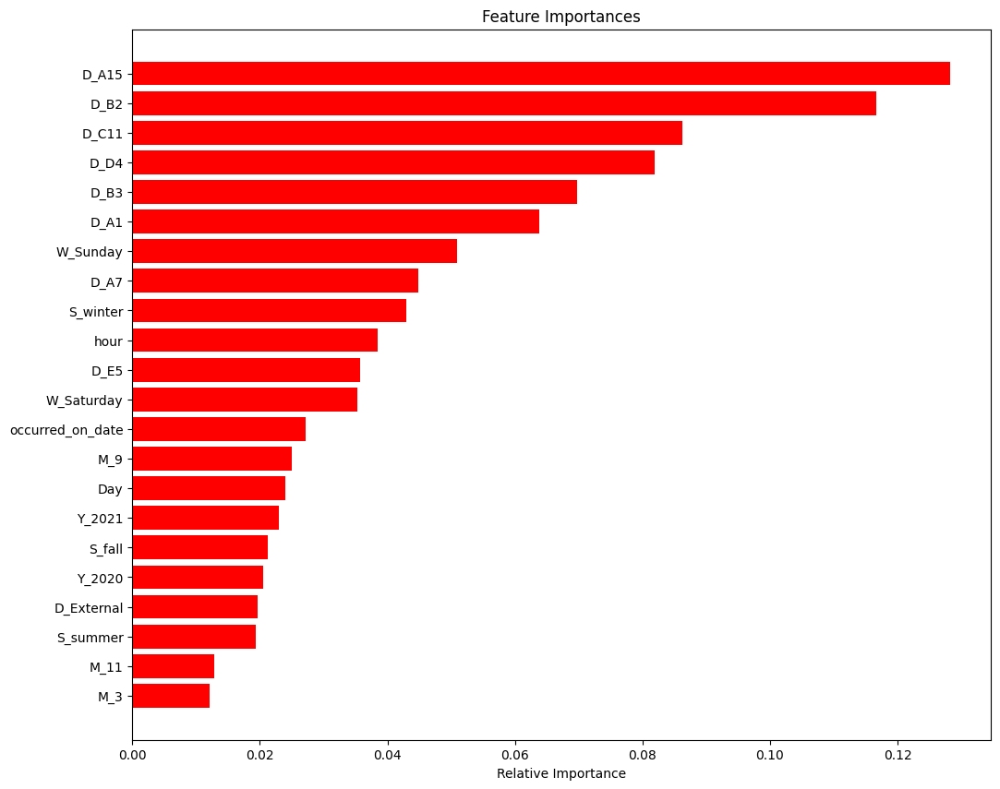

In [84]:
feature_names = list(x.columns)
importances = xgb.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12, 10))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="red", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [77]:
importances[indices]

array([0.00538524, 0.0057019 , 0.00581481, 0.00655082, 0.00712702,
       0.00732723, 0.0074383 , 0.0077783 , 0.00799575, 0.00804732,
       0.00810024, 0.00831779, 0.00863122, 0.00865702, 0.00875222,
       0.00949608, 0.01007518, 0.01008778, 0.01058674, 0.01060006,
       0.01072862, 0.01113196, 0.01319155, 0.01322312, 0.01337196,
       0.01349629, 0.01481762, 0.01596688, 0.01626212, 0.01741748,
       0.02000104, 0.02042216, 0.02086598, 0.02361799, 0.02617611,
       0.02814571, 0.03765251, 0.03782631, 0.04196692, 0.05121762,
       0.0591603 , 0.06759091, 0.06821936, 0.09392111, 0.10113727],
      dtype=float32)

In [78]:
[feature_names[i] for i in indices]

['Y_2019',
 'D_D14',
 'W_Tuesday',
 'M_12',
 'M_2',
 'W_Monday',
 'M_4',
 'D_E13',
 'D_E18',
 'M_8',
 'M_10',
 'W_Thursday',
 'M_6',
 'W_Wednesday',
 'M_5',
 'Y_2016',
 'Y_2017',
 'Y_2018',
 'S_spring',
 'M_7',
 'M_1',
 'W_Friday',
 'D_C6',
 'Y_2020',
 'M_11',
 'Day',
 'D_External',
 'M_9',
 'S_fall',
 'Y_2021',
 'occurred_on_date',
 'M_3',
 'S_summer',
 'D_E5',
 'hour',
 'W_Saturday',
 'W_Sunday',
 'S_winter',
 'D_A7',
 'D_A1',
 'D_B3',
 'D_D4',
 'D_C11',
 'D_B2',
 'D_A15']

In [50]:
df_ab

,occurred_on_date,hour,Day,Night,case_count,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5,D_External,W_Friday,W_Monday,W_Saturday,W_Sunday,W_Thursday,W_Tuesday,W_Wednesday,S_fall,S_spring,S_summer,S_winter,M_1,M_2,M_3,M_4,M_5,M_6,M_7,M_8,M_9,M_10,M_11,M_12,Y_2015,Y_2016,Y_2017,Y_2018,Y_2019,Y_2020,Y_2021,Y_2022
0,735764,0,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
1,735764,1,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
2,735764,2,0,1,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
3,735764,7,1,0,1,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
4,735764,8,1,0,2,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
341922,738397,2,0,1,1,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
341923,738397,3,0,1,1,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
341924,738397,2,0,1,1,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1
341925,738397,1,0,1,2,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0,0,0,1,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1


In [128]:
x_train.shape

(19101, 21)

## SequentialFeatureSelector(LGBM) 

In [129]:
lgbm = LGBMRegressor(n_estimators = 200, tree_method = 'gpu_hist')
sf = sfs(lgbm, 20, verbose = 2, scoring = 'r2', n_jobs = -1).fit(x_train, y_train)

[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  17 out of  21 | elapsed:    3.8s remaining:    0.8s
[Parallel(n_jobs=-1)]: Done  21 out of  21 | elapsed:    4.0s finished

[2022-10-20 21:28:33] Features: 1/20 -- score: 0.1716061342116048[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  16 out of  20 | elapsed:    1.5s remaining:    0.3s
[Parallel(n_jobs=-1)]: Done  20 out of  20 | elapsed:    1.6s finished

[2022-10-20 21:28:35] Features: 2/20 -- score: 0.2980476532759215[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  14 out of  19 | elapsed:    1.4s remaining:    0.5s
[Parallel(n_jobs=-1)]: Done  19 out of  19 | elapsed:    1.9s finished

[2022-10-20 21:28:37] Features: 3/20 -- score: 0.4205873058469643[Parallel(n_jobs=-1)]: Using backend LokyBackend with 8 concurrent workers.
[Parallel(n_jobs=-1)]: Done  13 out of  18

In [131]:
sf.subsets_

{1: {'feature_idx': (4,),
  'cv_scores': array([0.17503185, 0.19199984, 0.17349068, 0.16809611, 0.1494122 ]),
  'avg_score': 0.1716061342116048,
  'feature_names': ('D_B2',)},
 2: {'feature_idx': (4, 6),
  'cv_scores': array([0.30438779, 0.30415681, 0.30583066, 0.3022245 , 0.2736385 ]),
  'avg_score': 0.2980476532759215,
  'feature_names': ('D_B2', 'D_C11')},
 3: {'feature_idx': (4, 6, 9),
  'cv_scores': array([0.41861497, 0.42799855, 0.42626859, 0.41780269, 0.41225172]),
  'avg_score': 0.4205873058469643,
  'feature_names': ('D_B2', 'D_C11', 'D_D4')},
 4: {'feature_idx': (0, 4, 6, 9),
  'cv_scores': array([0.52056264, 0.52913153, 0.52403749, 0.52935373, 0.50109141]),
  'avg_score': 0.5208353591883851,
  'feature_names': ('occurred_on_date', 'D_B2', 'D_C11', 'D_D4')},
 5: {'feature_idx': (0, 4, 5, 6, 9),
  'cv_scores': array([0.61823247, 0.61964858, 0.61398697, 0.62517772, 0.58998941]),
  'avg_score': 0.6134070289950639,
  'feature_names': ('occurred_on_date', 'D_B2', 'D_B3', 'D_C11', 

In [133]:
sf.k_feature_idx_

(0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, 12, 13, 14, 15, 16, 18, 19, 20)

In [137]:
X_train_sfs = sf.transform(x_train)
X_test_sfs = sf.transform(x_test)
lgbm = LGBMRegressor(n_estimators = 200).fit(X_train_sfs, y_train)
print(r2_score(lgbm.predict(X_test_sfs), y_test))
print(r2_score(lgbm.predict(X_train_sfs), y_train))

0.7169472998891175
0.7539811945808947


# AutoKeras

In [51]:
import autokeras as ak

In [140]:
NNreg = ak.StructuredDataRegressor(max_trials = 50, metrics = [tfa.metrics.RSquare()], seed = 24)
NNreg.fit(x_train, y_train, epochs = 100, verbose = 2)

INFO:tensorflow:Reloading Oracle from existing project .\structured_data_regressor\oracle.json
INFO:tensorflow:Reloading Tuner from .\structured_data_regressor\tuner0.json
INFO:tensorflow:Oracle triggered exit
Epoch 1/100
597/597 [==============================] - 1s 1ms/step - loss: 100.3074 - r_square: 0.2025
Epoch 2/100
597/597 [==============================] - 1s 1ms/step - loss: 42.2956 - r_square: 0.6637
Epoch 3/100
597/597 [==============================] - 1s 1ms/step - loss: 41.4649 - r_square: 0.6703
Epoch 4/100
597/597 [==============================] - 1s 1ms/step - loss: 40.9740 - r_square: 0.6742
Epoch 5/100
597/597 [==============================] - 1s 1ms/step - loss: 40.5645 - r_square: 0.6775
Epoch 6/100
597/597 [==============================] - 1s 1ms/step - loss: 40.2621 - r_square: 0.6799
Epoch 7/100
597/597 [==============================] - 1s 1ms/step - loss: 39.9854 - r_square: 0.6821
Epoch 8/100
597/597 [==============================] - 1s 1ms/step - loss: 

In [142]:
print(r2_score(NNreg.predict(x_test),y_test))
print(r2_score(NNreg.predict(x_train),y_train))

398/398 [==============================] - 1s 1ms/step
0.6603236814024587
597/597 [==============================] - 1s 1ms/step
0.6674058068332995


# All Model Scores 

In [20]:
algo_accuracy = pd.DataFrame({"Algorithms":["LinearRegression", "XGBRegressor", "LGBMRegressor", "RandomForest", 
                                            "LGBM\n(RSCV)", 'TPOT\nRegressor',
                                            "RandomForest\n(RSCV)", "AutoKeras", "LGBM(SFS)",
                                            "LGBM(GSCV)"], 
                              "Test_r2_score":[0.713,0.788, 0.784, 0.729, 0.777, 0.709, 0.773, 0.660, 0.716, 
                                               0.76],
                              "Train_r2_score":[0.589,0.833, 0.749, 0.958, 0.755, 0.732, 0.751, 0.667, 0.753, 
                                                0.74]})
algo_accuracy.sort_values(by = 'Test_r2_score', ascending = False, inplace = True)
algo_accuracy = algo_accuracy.reset_index(drop = True)
algo_accuracy

,Algorithms,Test_r2_score,Train_r2_score
0,XGBRegressor,0.788,0.833
1,LGBMRegressor,0.784,0.749
2,LGBM\n(RSCV),0.777,0.755
3,RandomForest\n(RSCV),0.773,0.751
4,LGBM(GSCV),0.760,0.740
5,RandomForest,0.729,0.958
6,LGBM(SFS),0.716,0.753
7,LinearRegression,0.713,0.589
8,TPOT\nRegressor,0.709,0.732
9,AutoKeras,0.660,0.667


<AxesSubplot:xlabel='Algorithms', ylabel='Test_r2_score'>

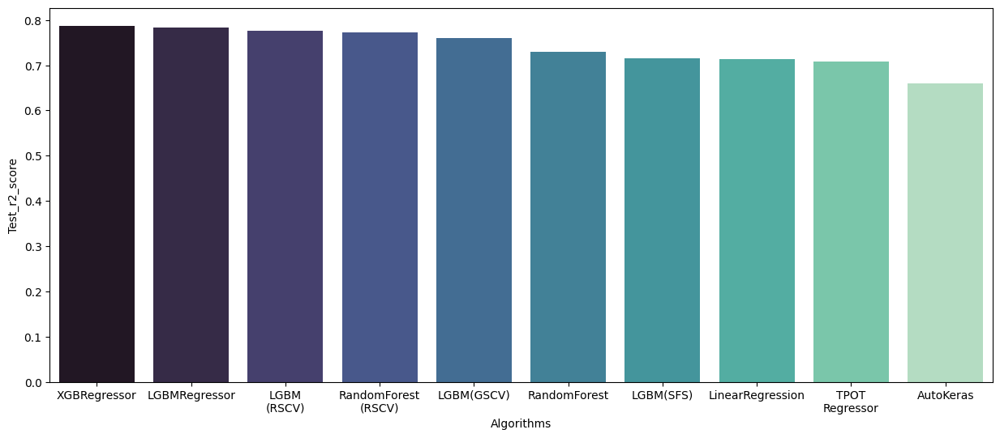

In [30]:
plt.figure(figsize = (15,6))
sb.barplot(data = algo_accuracy, x = 'Algorithms', y = 'Test_r2_score', palette = 'mako')

In [47]:
pickle.dump(lr, open('LRmodel.pkl', 'wb'))

In [250]:
xgb.save_model('model.json')

# Pipeline

In [60]:
pipe = Pipeline([('standardscaler',StandardScaler()), ('xgb',XGBRegressor())], verbose = True)
pipe.fit(x_train, y_train)


[Pipeline] .... (step 1 of 2) Processing standardscaler, total=   0.0s
[Pipeline] ............... (step 2 of 2) Processing xgb, total=   0.8s


Pipeline(steps=[('standardscaler', StandardScaler()),
                ('xgb',
                 XGBRegressor(base_score=0.5, booster='gbtree', callbacks=None,
                              colsample_bylevel=1, colsample_bynode=1,
                              colsample_bytree=1, early_stopping_rounds=None,
                              enable_categorical=False, eval_metric=None,
                              gamma=0, gpu_id=-1, grow_policy='depthwise',
                              importance_type=None, interaction_constraints='',
                              learning_rate=0.300000012, max_bin=256,
                              max_cat_to_onehot=4, max_delta_step=0,
                              max_depth=6, max_leaves=0, min_child_weight=1,
                              missing=nan, monotone_constraints='()',
                              n_estimators=100, n_jobs=0, num_parallel_tree=1,
                              predictor='auto', random_state=0, reg_alpha=0,
                              reg_lambda=1, ...))],
         verbose=True)

In [59]:
x_train

,occurred_on_date,D_A1,D_A15,D_A7,D_B2,D_B3,D_C11,D_C6,D_D14,D_D4,D_E13,D_E18,D_E5,D_External,day_1,day_2,day_3,day_4,day_5,day_6,day_7
29763,738226,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,0,1,0
1308,735873,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0
26132,737925,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,1,0
24528,737795,1,0,0,0,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0
22023,737593,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0,0,0
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
7436,736384,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0,0
12799,736831,0,0,0,0,0,0,0,0,0,1,0,0,0,0,0,0,1,0,0,0
31131,738339,0,0,1,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,0,1
7365,736378,0,0,0,0,0,0,0,1,0,0,0,0,0,0,0,0,0,0,1,0


In [68]:
pipe.predict([[738660,0 ,0 	,0, 0 	,1 	,0 ,	0 ,	0 ,	0 	,0 	,0 ,	0 	,0 ,	0 ,	0 	,1 	,0	,0,	0 ,	0]])

array([11.401494], dtype=float32)

In [70]:
pickle.dump(pipe, open('pipe.pkl', 'wb'))

In [75]:
a = pickle.load(open('pipe.pkl', 'rb'))
a.score(x_test,y_test), a.score(x_train,y_train)

(0.7861334358998044, 0.8372210451394169)

In [129]:
df_reg.shape

(31835, 16)

In [69]:
for i in x.columns:
    if df[i].nunique() > 2 and df[i].nunique() < 15:
        df[i] = df[i].astype('category')

In [70]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21116 entries, 0 to 21115
Data columns (total 23 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   incident_number             21116 non-null  object  
 1   offense_code                21116 non-null  category
 2   offense_code_group          21116 non-null  object  
 3   offense_description         21116 non-null  object  
 4   district                    21116 non-null  category
 5   reporting_area              21116 non-null  object  
 6   shooting                    21116 non-null  int64   
 7   occurred_on_date            21116 non-null  object  
 8   year                        21116 non-null  category
 9   month                       21116 non-null  category
 10  day_of_week                 21116 non-null  category
 11  hour                        21116 non-null  int64   
 12  ucr_part                    21116 non-null  object  
 13  street          

In [32]:
len(df.offense_code.unique())

4

In [72]:
df.drop(['incident_number', 'offense_code_group', 'offense_description', 'occurred_on_date', 'street', 'location'], axis = 1, inplace = True)

In [73]:
df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21116 entries, 0 to 21115
Data columns (total 17 columns):
 #   Column                      Non-Null Count  Dtype   
---  ------                      --------------  -----   
 0   offense_code                21116 non-null  category
 1   district                    21116 non-null  category
 2   reporting_area              21116 non-null  object  
 3   shooting                    21116 non-null  int64   
 4   year                        21116 non-null  category
 5   month                       21116 non-null  category
 6   day_of_week                 21116 non-null  category
 7   hour                        21116 non-null  int64   
 8   ucr_part                    21116 non-null  object  
 9   lat                         21116 non-null  float64 
 10  long                        21116 non-null  float64 
 11  season                      21116 non-null  category
 12  avg_high_temp (C)           21116 non-null  category
 13  avg_low_temp (C)

In [33]:
"""data_profile = pandas_profiling.ProfileReport(df)
data_profile.to_file(output_file = 'final_Data_Profile.html')"""


"data_profile = pandas_profiling.ProfileReport(df)\ndata_profile.to_file(output_file = 'final_Data_Profile.html')"

In [115]:
new_df = copy.deepcopy(df)

In [35]:
new_df = new_df[['offense_code', 'district', 'shooting', 'month', 'day_of_week', 'hour', 'ucr_part', 'lat', 'long']]

In [36]:
new_df.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 21116 entries, 0 to 21115
Data columns (total 9 columns):
 #   Column        Non-Null Count  Dtype  
---  ------        --------------  -----  
 0   offense_code  21116 non-null  object 
 1   district      21116 non-null  object 
 2   shooting      21116 non-null  int64  
 3   month         21116 non-null  int64  
 4   day_of_week   21116 non-null  object 
 5   hour          21116 non-null  int64  
 6   ucr_part      21116 non-null  object 
 7   lat           21116 non-null  float64
 8   long          21116 non-null  float64
dtypes: float64(2), int64(3), object(4)
memory usage: 1.5+ MB


In [37]:
df['ucr_part'].dtype

dtype('O')

In [38]:
enc = le()
for i in new_df.columns:
    if new_df[i].dtype == 'O':
        new_df[i] = enc.fit_transform(df[i])

In [50]:
new_df

,offense_code,district,shooting,month,day_of_week,hour,ucr_part,lat,long
0,0,8,0,12,5,12,3,42.342432,-71.072258
1,0,10,0,12,5,12,3,42.268897,-71.108137
2,0,3,0,12,5,12,3,42.323410,-71.093396
3,0,4,0,12,5,0,3,42.279971,-71.095534
4,3,2,0,12,5,0,1,42.370818,-71.039291
...,...,...,...,...,...,...,...,...,...
21111,1,0,0,1,2,1,2,42.359330,-71.053550
21112,3,0,0,1,2,0,1,42.360688,-71.056873
21113,0,11,0,1,2,0,3,42.292092,-71.121089
21114,3,8,0,1,2,0,1,42.346251,-71.099539


<AxesSubplot:>

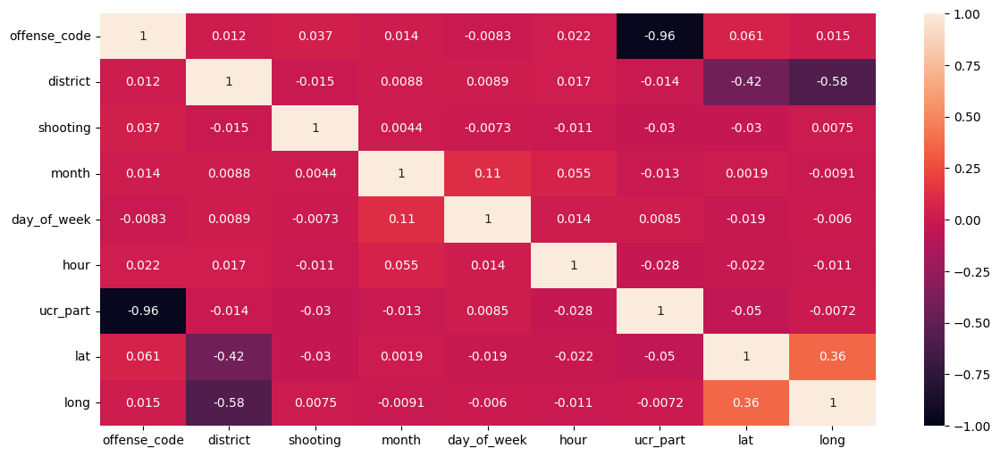

In [40]:
plt.figure(figsize = (14,6))
sb.heatmap(new_df.corr(), vmin = -1, vmax = 1, annot = True)

In [41]:
x = new_df.drop('ucr_part', axis = 1)
y = new_df['ucr_part']

In [42]:
x_train, x_test, y_train, y_test = tts(x,y, test_size = 0.25)

In [43]:
y_train.value_counts()

2    7838
3    5028
1    2917
0      54
Name: ucr_part, dtype: int64

In [44]:
over_sample = SMOTE(n_jobs = -1)
x_train,y_train= over_sample.fit_resample(x_train,y_train)

In [45]:
dtc = DecisionTreeClassifier().fit(x_train, y_train)
pred = dtc.predict(x_test)
pred

array([3, 2, 2, ..., 1, 1, 2])

In [46]:
print(cr(pred, y_test))

              precision    recall  f1-score   support

           0       1.00      1.00      1.00        17
           1       1.00      1.00      1.00       972
           2       1.00      1.00      1.00      2601
           3       1.00      1.00      1.00      1689

    accuracy                           1.00      5279
   macro avg       1.00      1.00      1.00      5279
weighted avg       1.00      1.00      1.00      5279



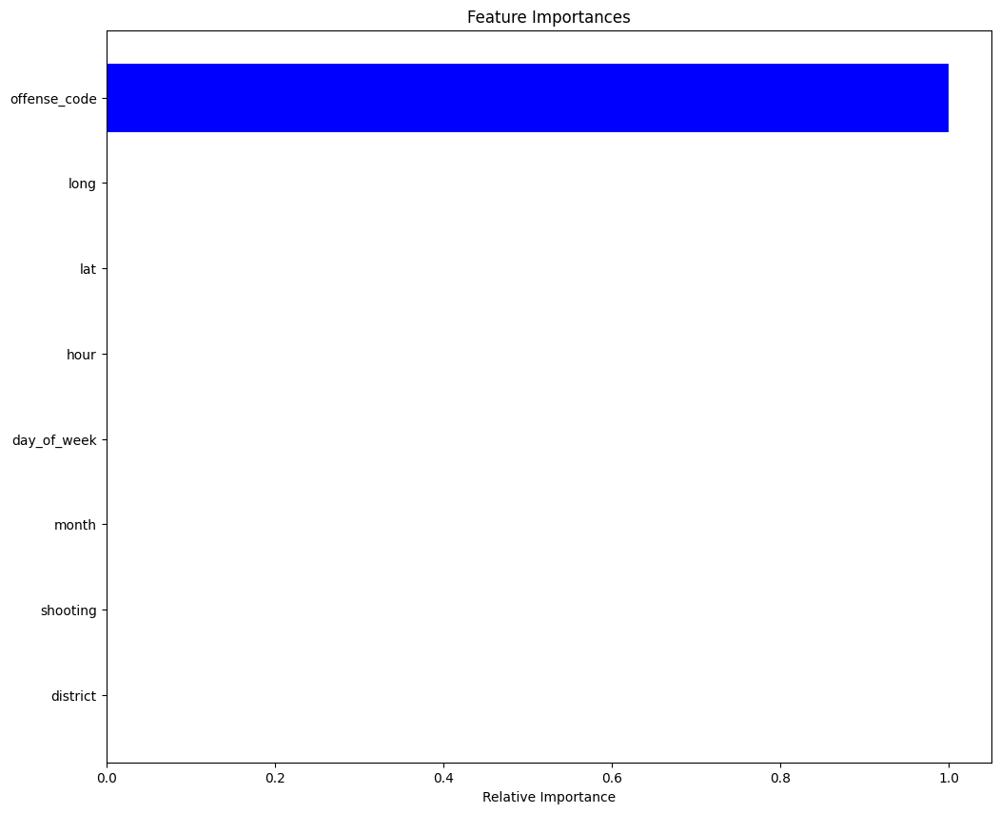

In [47]:
feature_names = list(x.columns)
importances = dtc.feature_importances_
indices = np.argsort(importances)
plt.figure(figsize=(12, 10))
plt.title("Feature Importances")
plt.barh(range(len(indices)), importances[indices], color="blue", align="center")
plt.yticks(range(len(indices)), [feature_names[i] for i in indices])
plt.xlabel("Relative Importance")
plt.show()

In [48]:
from sklearn.feature_selection import VarianceThreshold

In [49]:
selector = VarianceThreshold()
selector.fit_transform(x_train)

array([[  0.        ,   5.        ,   0.        , ...,  16.        ,
         42.30839354, -71.06473124],
       [  0.        ,   4.        ,   0.        , ...,  11.        ,
         42.29276044, -71.07486603],
       [  1.        ,   3.        ,   0.        , ...,  10.        ,
         42.32866284, -71.08563401],
       ...,
       [  0.        ,   9.        ,   0.        , ...,  15.        ,
         42.31603034, -71.09781673],
       [  0.        ,  11.        ,   0.        , ...,  12.        ,
         42.28721378, -71.14757726],
       [  0.        ,   2.        ,   0.        , ...,   9.        ,
         42.34117031, -71.0847324 ]])

In [ ]:
finance = pd.DataFrame({"Type":["State Prisoner", "Federal Prisoner", "Local Prisoner"], 
                              "Count":[0.713,0.788, 0.784, 0.729, 0.777, 0.709, 0.773, 0.660, 0.716, 
                                               0.76],
                              "Train_r2_score":[0.589,0.833, 0.749, 0.958, 0.755, 0.732, 0.751, 0.667, 0.753, 
                                                0.74]})
algo_accuracy.sort_values(by = 'Test_r2_score', ascending = False, inplace = True)
algo_accuracy = algo_accuracy.reset_index(drop = True)
algo_accuracy

In [90]:
crime_pct = pd.DataFrame({"Race":["White", "Black", "Hispanic"], 
                              "Prisoner Counts":[4388,3012, 2953, ],
                              "Total Population":[5573808,649580, 894044],
                             "Percentage (%)" : [0.08, 0.47, 0.33], 
                         "Spend (Million $)" : [263.28, 180.72, 177.18]})
crime_pct.sort_values(by = 'Percentage (%)', ascending = False, inplace = True)
crime_pct = crime_pct.reset_index(drop = True)
crime_pct.T

,0,1,2
Race,Black,Hispanic,White
Prisoner Counts,3012,2953,4388
Total Population,649580,894044,5573808
Percentage (%),0.47,0.33,0.08
Spend (Million $),180.72,177.18,263.28


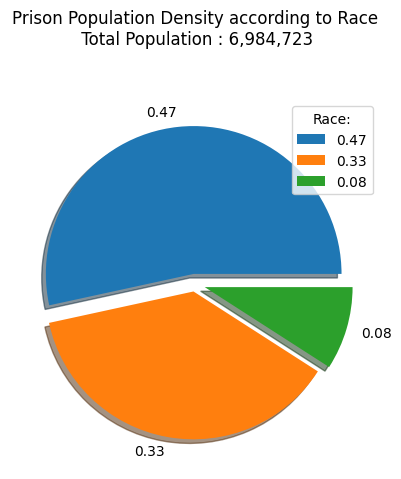

In [79]:
plt.pie(crime_pct['Percentage (%)'], shadow = True, explode = [0.07, 0.05, 0.07],labels = crime_pct['Percentage (%)'], radius = 1)
plt.legend(title = "Race:")
plt.title("Prison Population Density according to Race\n Total Population : 6,984,723", pad = 40)
plt.show()

# Criminal constitution is higher in black race